You can perform audio enhancement techniques like noise removal and equalization in Python using a combination of specialized libraries. While `librosa` is excellent for loading, resampling, and analyzing audio, it doesn't have built-in functions for noise reduction or equalization. For those tasks, you'll need to use other libraries that are often used alongside `librosa`.

***

### 1. Noise Reduction 🧼

The most common and effective method for noise reduction is **spectral gating**. This technique works in the frequency domain. It identifies the noise floor (the level of background noise) and then "gates" or reduces all frequencies that fall below that threshold, while leaving the louder, more prominent signals untouched. This is a great way to clean up recordings.

* **Libraries:** The **`noisereduce`** library is a popular and straightforward choice for this purpose. It is specifically designed to reduce stationary or non-stationary noise from audio signals. Another library you could use is **`pysndfx`**, which provides a chain of audio effects, including noise gate functionality.

* **Typical Workflow:**
    1.  Load the audio file using `librosa.load()`.
    2.  Use a library like `noisereduce` to apply the noise reduction algorithm. This often requires you to provide a small segment of the audio that contains only the noise so the algorithm can create a "noise profile." If you don't have a specific noise sample, `noisereduce` can also estimate the noise from the entire file.
    3.  Save the cleaned audio to a new file using a library like `soundfile`.

### 2. Equalization (EQ) 🎛️

Equalization is the process of adjusting the balance of different frequency components in an audio signal. This is done with **digital filters**. For example, you can boost high frequencies to make a recording sound "brighter" or cut low frequencies to remove a "muddy" quality. `librosa` can be used to analyze frequencies via spectrograms, but for applying the actual filters, you'll need other tools.

* **Libraries:** The **`scipy.signal`** module provides robust functions for designing and applying digital filters (like Butterworth filters) that are fundamental to equalization. For a simpler, more high-level interface, libraries like **`pydub`** and **`pedalboard`** offer easier ways to apply equalization effects. `pedalboard`, developed by Spotify, is particularly powerful for adding studio-quality effects.

* **Typical Workflow:**
    1.  Load the audio data using a library that can read sound files into a NumPy array (like `librosa.load()` or `soundfile`).
    2.  Design a digital filter (e.g., a high-pass or low-pass filter) using `scipy.signal.butter()`.
    3.  Apply this filter to the audio data using `scipy.signal.lfilter()`.
    4.  Save the processed audio.


***
An overview of the librosa library, including how to load audio and visualize it, can be found in this video. [Introduction to Librosa: Audio Waveforms & Spectrograms in Python](https://www.youtube.com/watch?v=mUeRxXwtZAs)
http://googleusercontent.com/youtube_content/1

In [1]:
!pip install noisereduce

In [23]:
import librosa
import noisereduce as nr
import numpy as np
from scipy.signal import butter, lfilter
from IPython.display import Audio

def butter_highpass(cutoff, fs, order=5):
    """
    Designs a Butterworth high-pass filter.
    cutoff: The cutoff frequency in Hz.
    fs: The sample rate of the audio.
    order: The filter order.
    """
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

def apply_highpass_filter(data, cutoff, fs, order=5):
    """
    Applies the high-pass filter to the audio data.
    """
    b, a = butter_highpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y

def enhance_audio(y, sr):
    """
    Performs noise reduction and a simple equalization on an audio file.

    input_path (str): The path to the input audio file (e.g., 'audio.mp3').
    output_path (str): The path to save the enhanced audio file (e.g., 'cleaned_audio.wav').
    sr (int): The sample rate to use for loading and processing.
    """
    #print(f"Loading audio from: {input_path}")
    # 1. Load the audio file
    #y, sr = librosa.load(input_path, sr=sr, mono=True)
    
    # 2. Noise Reduction
    # We assume the first 1.5 seconds of the audio is noise.
    # Adjust this if your noise sample is at a different location.
    noise_clip = y[:int(sr * 1.5)]
    print("Performing noise reduction...")
    y_reduced = nr.reduce_noise(y=y, sr=sr, y_noise=noise_clip)
    
    # 3. Equalization (High-pass filter)
    # A high-pass filter can remove low-frequency rumble or hum.
    # Here, we set a cutoff of 100 Hz. Adjust as needed.
    cutoff_frequency = 100
    print(f"Applying high-pass filter at {cutoff_frequency} Hz...")
    y_enhanced = apply_highpass_filter(y_reduced, cutoff_frequency, sr)
    
    # Normalize the final output to prevent clipping
    y_enhanced /= np.max(np.abs(y_enhanced))
    
    # 4. Save the processed audio
    #sf.write(output_path, y_enhanced, sr)
    #print(f"Enhanced audio saved to: {output_path}")

    return y_enhanced, sr

# --- Example Usage ---
# Create a dummy audio file for demonstration
print("Creating a dummy audio file for demonstration...")
dummy_sr = 22050
dummy_y = np.random.randn(dummy_sr * 5) * 0.1 # 5 seconds of low-volume noise
signal = np.sin(2 * np.pi * 440 * np.linspace(0, 5, dummy_sr * 5)) * 0.5 # A 440 Hz tone
dummy_y += signal
#sf.write("input_audio.wav", dummy_y, dummy_sr)

dummy_y, dummy_sr = librosa.load("test.wav")

y_enhanced, sr = enhance_audio(dummy_y, dummy_sr)
# Use IPython.display.Audio to create an audio player widget
Audio(data=dummy_y, rate=dummy_sr)


Creating a dummy audio file for demonstration...
Performing noise reduction...
Applying high-pass filter at 100 Hz...


In [24]:
Audio(data=y_enhanced, rate=sr)

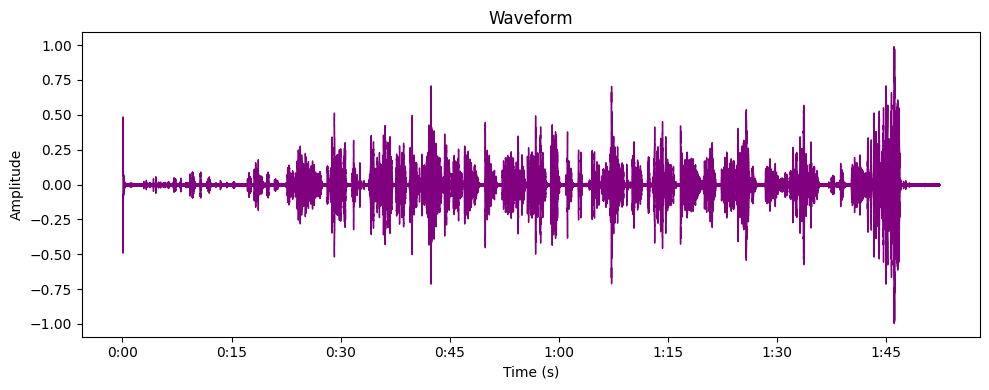

In [36]:
import matplotlib.pyplot as plt

def plot_waveform(y, sr):
    ## Plot waveform
    plt.figure(figsize=(10,4))
    librosa.display.waveshow(y, sr=sr, color="purple")
    plt.title("Waveform")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.tight_layout()
    plt.show()

plot_waveform(dummy_y, dummy_sr)


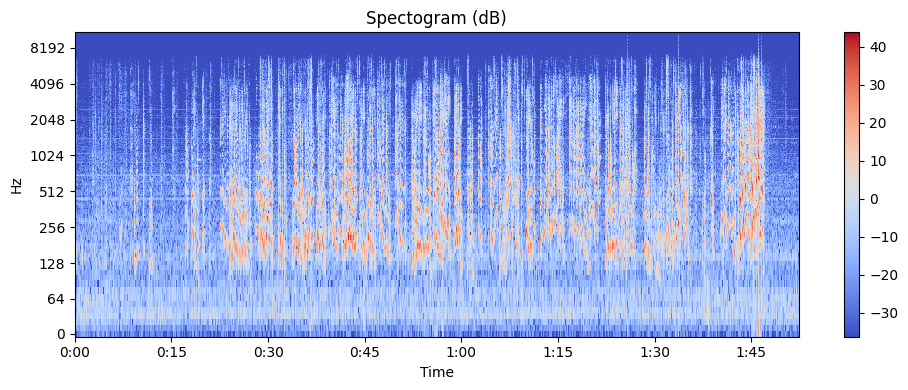

In [37]:
def plot_spectogram(y, sr):
    ## Plot spectogram
    # calculate short time fourier transform
    stft = librosa.stft(y)
    # convert to decibels
    spectogram = librosa.amplitude_to_db(np.abs(stft))
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(spectogram, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar()
    plt.title("Spectogram (dB)")
    plt.tight_layout()
    plt.show()


plot_spectogram(dummy_y, dummy_sr)

### 1\. Framing

Framing divides a continuous audio signal into smaller, overlapping segments, or "frames." This is a fundamental step for SER because emotions are often expressed over short, dynamic time periods, and features need to be extracted from these smaller chunks.

In [27]:

def framing(y, sr, frame_length=0.025, hop_length=0.01):
    """
    Splits the audio signal into overlapping frames.

    Args:
        y (np.ndarray): The audio time series.
        sr (int): The sample rate.
        frame_length (float): Duration of each frame in seconds.
        hop_length (float): The step size between frames in seconds.

    Returns:
        np.ndarray: A 2D array of framed audio signals.
    """
    frame_size = int(frame_length * sr)
    hop_size = int(hop_length * sr)
    
    # librosa.util.frame is the most efficient way to do this
    frames = librosa.util.frame(y, frame_length=frame_size, hop_length=hop_size)
    return frames

frames = framing(dummy_y, dummy_sr)
print(frames.shape)


(551, 11262)


### 2\. Windowing

Windowing is the process of applying a "window function" to each frame. This is done to reduce signal discontinuities at the beginning and end of each frame, which helps minimize spectral leakage when performing a Fast Fourier Transform (FFT).

In [28]:
import librosa

def windowing(frames, window_type='hann'):
    """
    Applies a window function to each frame.

    Args:
        frames (np.ndarray): The framed audio signal.
        window_type (str): The type of window function to apply (e.g., 'hann', 'hamm').

    Returns:
        np.ndarray: The windowed frames.
    """
    window = librosa.filters.get_window(window_type, frames.shape[0])
    windowed_frames = frames * window[:, np.newaxis]
    return windowed_frames

windowed_frames = windowing(frames)
print(windowed_frames.shape)

(551, 11262)


### 3\. Voice Activity Detection (VAD)

VAD is used to identify the parts of the audio signal that contain speech and to remove silent or non-speech segments. This is crucial for SER, as silence doesn't carry emotional information and can skew your results.

In [30]:
import librosa
import numpy as np

def vad(y, sr, top_db=10):
    """
    Detects and trims speech segments from the audio signal.

    Args:
        y (np.ndarray): The audio time series.
        sr (int): The sample rate.
        top_db (float): The threshold (in dB) below which silence is detected.

    Returns:
        np.ndarray: The audio signal with silent parts trimmed.
    """
    # librosa.effects.trim is a simple and effective VAD method
    # It removes silence from the beginning and end of the audio.
    y_trimmed, _ = librosa.effects.trim(y, top_db=top_db)
    return y_trimmed

y_trimmed = vad(dummy_y, dummy_sr)

Audio(data=y_trimmed, rate=dummy_sr)

### 4\. Normalization

Normalization scales the audio signal's amplitude to a standard range (e.g., -1.0 to 1.0). This is important for SER to ensure that the volume of the audio doesn't unfairly influence the model's predictions.

In [17]:
import librosa

def normalization(y):
    """
    Normalizes the audio signal to a peak value of 1.0.

    Args:
        y (np.ndarray): The audio time series.

    Returns:
        np.ndarray: The normalized audio signal.
    """
    return librosa.util.normalize(y)

### 5\. Noise Removal

Noise removal is the process of reducing or eliminating unwanted background noise. A cleaner signal leads to more accurate feature extraction for your SER model. This function uses the `noisereduce` library, which is a powerful tool for this purpose.

In [20]:
import librosa
import noisereduce as nr
import numpy as np

def noise_removal(y, sr, stationary=True):
    """
    Reduces noise from the audio signal.

    Args:
        y (np.ndarray): The audio time series.
        sr (int): The sample rate.
        stationary (bool): Whether the noise is stationary (e.g., fan hum) or not.

    Returns:
        np.ndarray: The audio signal with noise reduced.
    """
    # For a stationary noise, you can often provide a sample of the noise itself.
    # Here, we'll use a simple approach by assuming the quietest parts of the audio
    # contain the noise.
    
    # We can use the noisereduce library
    y_reduced = nr.reduce_noise(y=y, sr=sr, stationary=stationary)
    return y_reduced

y_enhanced = noise_removal(dummy_y, dummy_sr)

Audio(data=y_enhanced, rate=sr)

### 6\. Echo Cancellation

Echo cancellation is a specialized task, typically handled by dedicated algorithms that require a reference signal of the original sound. For a simple SER system, this is less common, but the core idea is to subtract the echo from the main signal. The following function is a simplified example of how this might be approached using a filter to subtract a delayed version of the signal.

In [19]:
import numpy as np
from scipy.signal import lfilter

def echo_cancellation(y, sr, delay_ms=100, alpha=0.5):
    """
    A simplified echo cancellation function. Note: This is not a full-fledged
    acoustic echo canceller but rather a conceptual example.

    Args:
        y (np.ndarray): The audio time series.
        sr (int): The sample rate.
        delay_ms (int): The echo delay in milliseconds.
        alpha (float): The echo attenuation factor (0.0 to 1.0).

    Returns:
        np.ndarray: The audio signal with echo reduced.
    """
    # Calculate the echo delay in samples
    delay_samples = int(delay_ms * sr / 1000)
    
    # Create an echo filter
    a = np.array([1, 0, 0, alpha])  # a simplified transfer function
    b = np.array([1, 0, 0, 0])     # a simplified transfer function
    
    # Apply a simplified inverse filter to subtract the echo
    y_echo_reduced = lfilter(b, a, y)
    
    return y_echo_reduced